In [2]:
import numpy as np
import pandas as pd
import os
import plotly.express as px
import plotly.offline as of
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from textblob import *
from nltk.corpus import stopwords
import string
from nltk.stem.porter import PorterStemmer
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

In [3]:
data = pd.read_csv('data/train.txt')
data.info()

# px.histogram(data, x = data['rating'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135000 entries, 0 to 134999
Data columns (total 15 columns):
age               134343 non-null float64
body type         124760 non-null object
bust size         122115 non-null object
category          135000 non-null object
fit               135000 non-null object
height            134513 non-null object
item_id           135000 non-null int64
rating            134944 non-null float64
rented for        134995 non-null object
review_date       135000 non-null object
review_summary    134766 non-null object
review_text       134954 non-null object
size              135000 non-null int64
user_id           135000 non-null int64
weight            114160 non-null object
dtypes: float64(2), int64(3), object(10)
memory usage: 15.4+ MB


In [4]:
data.isnull().sum()/len(data)*100

age                0.486667
body type          7.585185
bust size          9.544444
category           0.000000
fit                0.000000
height             0.360741
item_id            0.000000
rating             0.041481
rented for         0.003704
review_date        0.000000
review_summary     0.173333
review_text        0.034074
size               0.000000
user_id            0.000000
weight            15.437037
dtype: float64

In [5]:
data = data[~data['review_text'].isnull()]
data.shape

(134954, 15)

In [6]:
px.histogram(data, x = 'age')

In [7]:
px.histogram(data, x = data['category'])

In [8]:
px.histogram(data, x = data['rating'])

In [9]:
data['review_len'] = data['review_text'].astype(str).apply(len)
px.histogram(data, x = 'review_len')

In [11]:


data['token_count'] = data['review_text'].apply(lambda x: len(str(x).split()))

px.histogram(data, x = 'token_count')

In [15]:

from matplotlib import pyplot as plt 
from sklearn.feature_extraction.text import CountVectorizer
def top_n_ngram(corpus,n = None,ngram = 1):
    vec = CountVectorizer(stop_words = 'english',ngram_range=(ngram,ngram)).fit(corpus)
    bag_of_words = vec.transform(corpus) #Have the count of  all the words for each review
    sum_words = bag_of_words.sum(axis =0) #Calculates the count of all the word in the whole review
    words_freq = [(word,sum_words[0,idx]) for word,idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq,key = lambda x:x[1],reverse = True)
    return words_freq[:n]


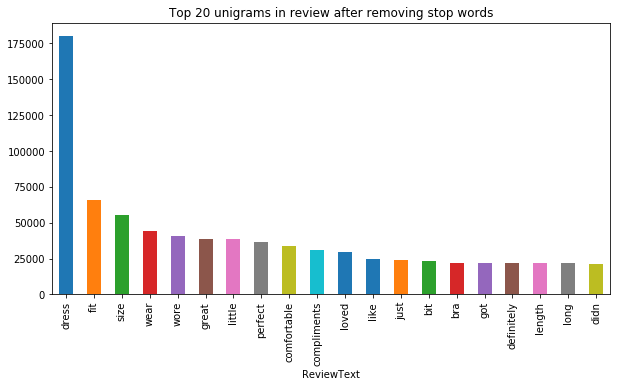

In [16]:
common_words = top_n_ngram(data['review_text'], 20,1)
df = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
plt.figure(figsize =(10,5))
df.groupby('ReviewText').sum()['count'].sort_values(ascending=False).plot(
kind='bar', title='Top 20 unigrams in review after removing stop words')

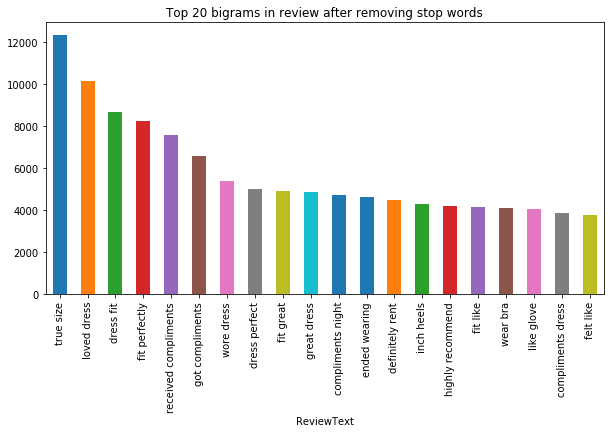

In [18]:
common_words = top_n_ngram(data['review_text'], 20,2)
df = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
plt.figure(figsize =(10,5))
df.groupby('ReviewText').sum()['count'].sort_values(ascending=False).plot(
kind='bar', title='Top 20 bigrams in review after removing stop words')

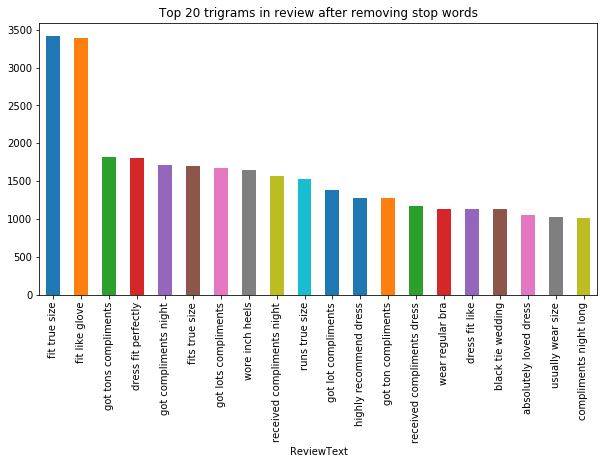

In [20]:


common_words = top_n_ngram(data['review_text'], 20,3)
df = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
plt.figure(figsize =(10,5))
df.groupby('ReviewText').sum()['count'].sort_values(ascending=False).plot(
kind='bar', title='Top 20 trigrams in review after removing stop words')



In [21]:
px.histogram(data, x = data['fit'])

In [25]:
data.drop(labels =['item_id','body type','bust size','weight','user_id','review_date','token_count'],axis = 1,inplace = True)

KeyError: "['item_id' 'body type' 'bust size' 'weight' 'user_id' 'review_date'] not found in axis"

<class 'pandas.core.frame.DataFrame'>
Int64Index: 134954 entries, 0 to 134999
Data columns (total 10 columns):
age               134299 non-null float64
category          134954 non-null object
fit               134954 non-null object
height            134468 non-null object
rating            134898 non-null float64
rented for        134950 non-null object
review_summary    134748 non-null object
review_text       134954 non-null object
size              134954 non-null int64
review_len        134954 non-null int64
dtypes: float64(2), int64(2), object(6)
memory usage: 11.3+ MB


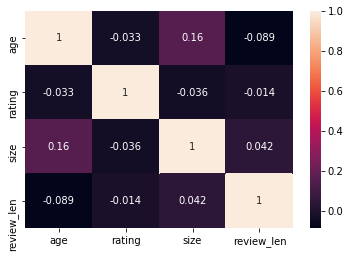

In [26]:
data.info()
X = data.drop(columns = 'fit')
import seaborn as sns
sns.heatmap(X.corr(),annot =True)